<a href="https://colab.research.google.com/github/sahinerguler/DataScienceTools/blob/master/Fuzzy_Image_Contrast_TR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Gerekli Kütüphanelerin Yüklenmesi**

In [ ]:
import math
import cv2
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import display, Markdown
from glob2 import glob

In [ ]:
PATH = 'C:/Users/Sahiner/input/'

**Piksel Yoğunluklarını Bulanıklaştırma ve Üyelik Fonksiyonları**



In [ ]:
# Gaussian Function:
def G(x, mean, std):
    return np.exp(-0.5*np.square((x-mean)/std))

# Membership Functions:
def AsiriKaranlik(x, M):                   #    ED: ExtremelyDark
    return G(x, -50, M/6)

def CokKoyu(x, M):                         #    VD: VeryDark
    return G(x, 0, M/6)

def Koyu(x, M):                            #    Da: Dark
    return G(x, M/2, M/6)

def BirazKaranlik(x, M):                   #    SD: SlightlyDark
    return G(x, 5*M/6, M/6)

def BirazParlak(x, M):                     #    SB: SlightlyBright
    return G(x, M+(255-M)/6, (255-M)/6)

def Parlak(x, M):                          #    Br: Bright
    return G(x, M+(255-M)/2, (255-M)/6)

def CokParlak(x, M):                       #    VB: VeryBright
    return G(x, 255, (255-M)/6)

def AsiriParlak(x, M):                     #    EB: ExtremelyBright
    return G(x, 305, (255-M)/6)


**Yoğunluk Ortalamalarına Göre Koyuluk - Aydınlık Aralık ve Değerleri**

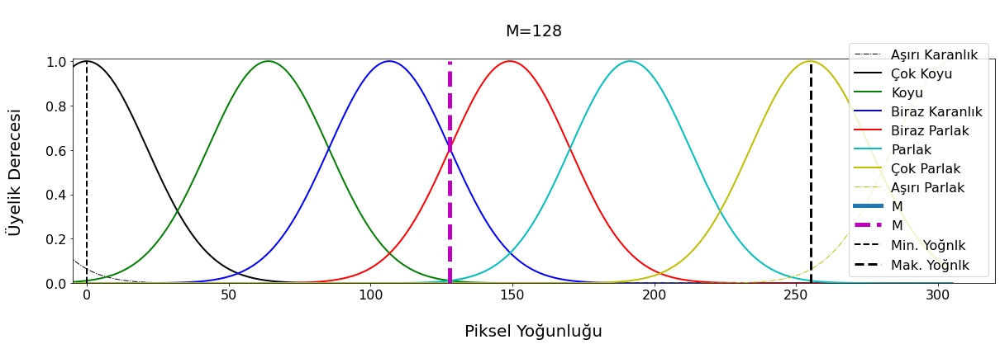

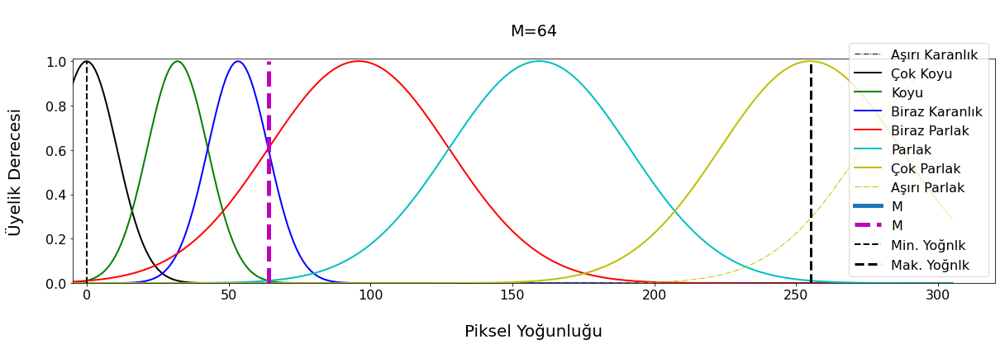

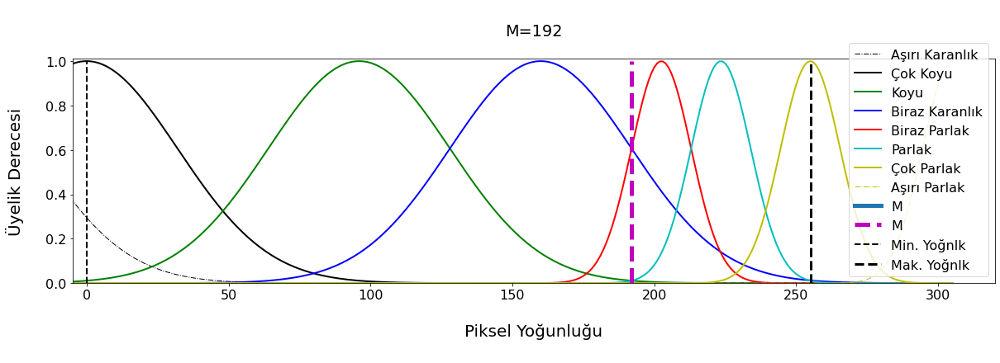

In [ ]:
for M in (128, 64, 192):
    x = np.arange(-50, 306)
    AK = AsiriKaranlik(x, M)
    CK = CokKoyu(x, M)
    Ky = Koyu(x, M)
    BK = BirazKaranlik(x, M)
    BP = BirazParlak(x, M)
    Pa = Parlak(x, M)
    CP = CokParlak(x, M)
    AP = AsiriParlak(x, M)

    plt.rcParams['font.size'] = '16'
    
    plt.figure(figsize=(20,5))
    plt.plot(x, AK, 'k-.',label='Aşırı Karanlık', linewidth=1)
    plt.plot(x, CK, 'k-',label='Çok Koyu', linewidth=2)
    plt.plot(x, Ky, 'g-',label='Koyu', linewidth=2)
    plt.plot(x, BK, 'b-',label='Biraz Karanlık', linewidth=2)
    plt.plot(x, BP, 'r-',label='Biraz Parlak', linewidth=2)
    plt.plot(x, Pa, 'c-',label='Parlak', linewidth=2)
    plt.plot(x, CP, 'y-',label='Çok Parlak', linewidth=2)
    plt.plot(x, AP, 'y-.',label='Aşırı Parlak', linewidth=1)
    plt.plot(100, 50,(M, M), (0, 1), 'm--', label='M', linewidth=5)
    plt.plot((0, 0), (0, 1), 'k--', label='Min. Yoğnlk', linewidth=2)
    plt.plot((255, 255), (0, 1), 'k--', label='Mak. Yoğnlk', linewidth=3)
    plt.legend()
    plt.xlim(-5, 320)
    plt.ylim(0.0, 1.01)
    plt.xlabel('\nPiksel Yoğunluğu\n', fontsize=20)
    plt.ylabel('Üyelik Derecesi\n', fontsize=20)
    plt.title(f'\nM={M}\n')
    plt.show()

**Kural Seti**

1.   Giriş:	Çok Koyu .......... ise; ..... Çıkış:	Aşırı Karanlık (AK)
2.   Giriş:	Koyu .................. ise; ..... Çıkış:	Çok Koyu (CK)
1.   Giriş:	Biraz Karanlık ....ise; ..... Çıkış:	Koyu (Ky)
2.   Giriş:	Biraz Parlak ......	ise; ..... Çıkış:	Parlak (Pr)
1.   Giriş:	Parlak ................ ise; ..... Çıkış:	Çok Parlak (CP)
2.   Giriş:	Çok Parlak ........ ise; ..... Çıkış:	Aşırı Parlak (AP)

**Defuzzification (Mamdani Meodu ile)**

In [ ]:
def OutputFuzzySet(x, f, M, thres):
    x = np.array(x)
    result = f(x, M)
    result[result > thres] = thres
    return result

def AggregateFuzzySets(fuzzy_sets):
    return np.max(np.stack(fuzzy_sets), axis=0)

def Infer(i, M, get_fuzzy_set=False):
    # Calculate degree of membership for each class
    CK = CokKoyu(i, M)
    Ky = Koyu(i, M)
    BK = BirazKaranlik(i, M)
    BP = BirazParlak(i, M)
    Pa = Parlak(i, M)
    CP = CokParlak(i, M)
    
    # Fuzzy Inference:
    x = np.arange(-50, 306)
    Inferences = (
        OutputFuzzySet(x, AsiriKaranlik, M, CK),
        OutputFuzzySet(x, CokKoyu, M, Ky),
        OutputFuzzySet(x, Koyu, M, BK),
        OutputFuzzySet(x, Parlak, M, BP),
        OutputFuzzySet(x, CokParlak, M, Pa),
        OutputFuzzySet(x, AsiriParlak, M, CP)
    )
    
    # Calculate AggregatedFuzzySet:
    fuzzy_output = AggregateFuzzySets(Inferences)
    
    # Calculate crisp value of centroid
    if get_fuzzy_set:
        return np.average(x, weights=fuzzy_output), fuzzy_output
    return np.average(x, weights=fuzzy_output)

**Çıkarım**

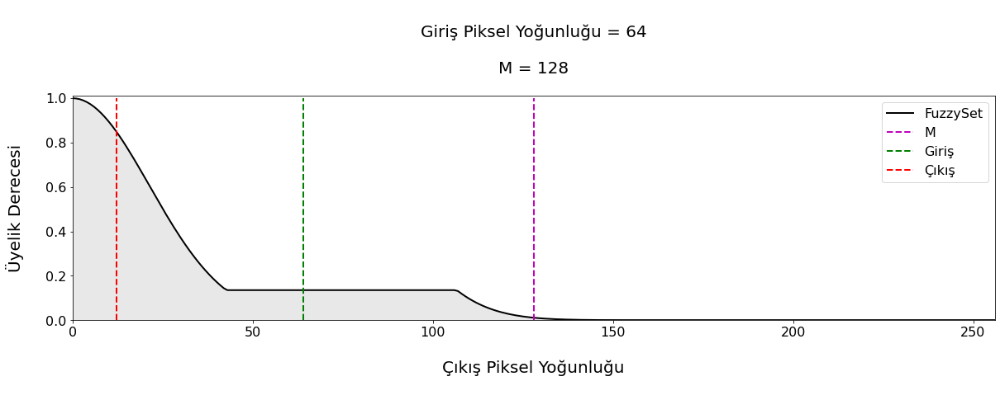

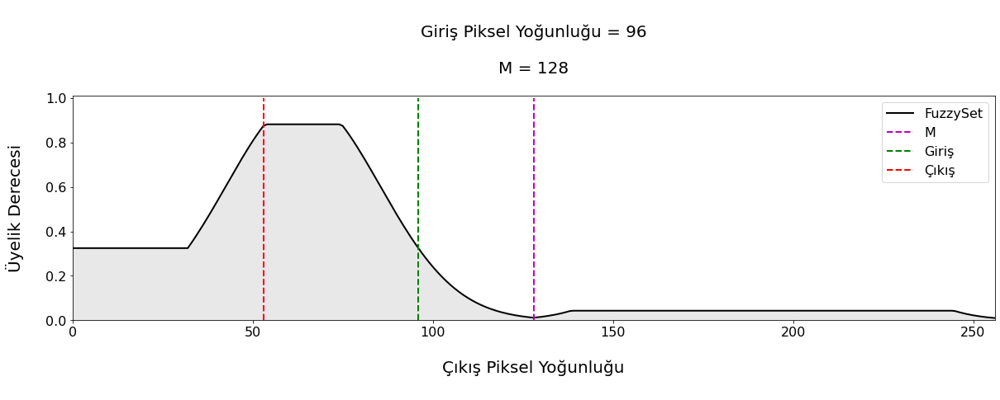

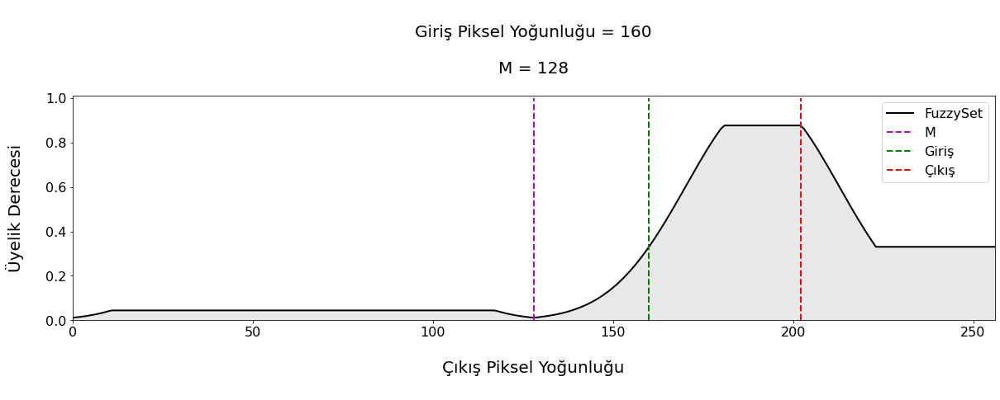

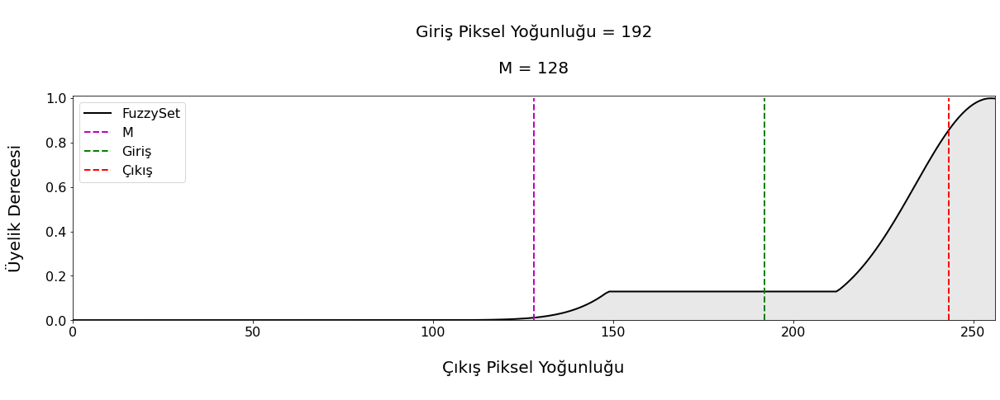

In [ ]:
for pixel in (64, 96, 160, 192):
    M = 128
    x = np.arange(-50, 306)
    centroid, output_fuzzy_set = Infer(np.array([pixel]), M, get_fuzzy_set=True)
    plt.figure(figsize=(20,5))
    plt.plot(x, output_fuzzy_set, 'k-',label='FuzzySet', linewidth=2)
    plt.plot((M, M), (0, 1), 'm--', label='M', linewidth=2)
    plt.plot((pixel, pixel), (0, 1), 'g--', label='Giriş', linewidth=2)
    plt.plot((centroid, centroid), (0, 1), 'r--', label='Çıkış', linewidth=2)
    plt.fill_between(x, np.zeros(356), output_fuzzy_set, color=(.9, .9, .9, .9))
    plt.legend()
    plt.xlim(0, 256)
    plt.ylim(0.0, 1.01)
    plt.xlabel('\nÇıkış Piksel Yoğunluğu\n', fontsize=20)
    plt.ylabel('Üyelik Derecesi\n', fontsize=20)
    plt.title(f'\nGiriş Piksel Yoğunluğu = {pixel}\n\nM = {M}\n', fontsize=20)
    plt.show()

M = 64 için:

CPU times: user 55.1 ms, sys: 961 µs, total: 56.1 ms
Wall time: 56.7 ms

-------------------------------------------------

M = 96 için:

CPU times: user 51.1 ms, sys: 0 ns, total: 51.1 ms
Wall time: 50.9 ms

-------------------------------------------------

M = 128 için:

CPU times: user 47.8 ms, sys: 0 ns, total: 47.8 ms
Wall time: 47.6 ms

-------------------------------------------------

M = 160 için:

CPU times: user 50.5 ms, sys: 942 µs, total: 51.4 ms
Wall time: 51.6 ms

-------------------------------------------------

M = 192 için:

CPU times: user 48.5 ms, sys: 0 ns, total: 48.5 ms
Wall time: 48.4 ms

-------------------------------------------------



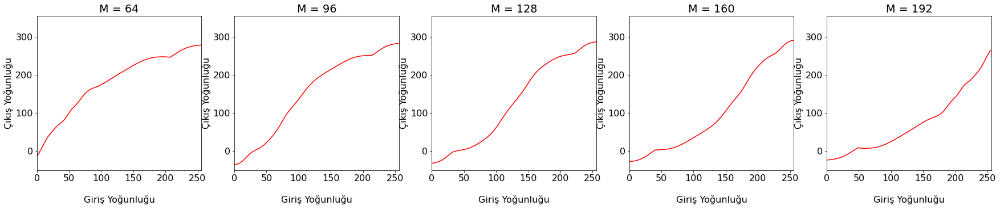

In [ ]:
means = (64, 96, 128, 160, 192)
plt.figure(figsize=(30,5))
for i in range(len(means)):
    M = means[i]
    x = np.arange(256)
    print(f'M = {M} için:\n')
    %time y = np.array([Infer(np.array([i]), M) for i in x])
    print('\n-------------------------------------------------\n')
    plt.subplot(1, len(means), i+1)
    plt.plot(x, y, 'r-', label='IO mapping')
    plt.xlim(0, 256)
    plt.ylim(-50, 355)
    plt.xlabel('\nGiriş Yoğunluğu\n')
    plt.ylabel('Çıkış Yoğunluğu')
    plt.title(f'M = {M}')
plt.show()

In [ ]:
# Proposed fuzzy method
def FuzzyContrastEnhance(rgb):
    # Convert RGB to LAB
    lab = cv2.cvtColor(rgb, cv2.COLOR_RGB2LAB)
    
    # Get L channel
    l = lab[:, :, 0]
    
    # Calculate M value
    M = np.mean(l)
    if M < 128:
        M = 127 - (127 - M)/2
    else:
        M = 128 + M/2
        
    # Precompute the fuzzy transform
    x = list(range(-50,306))
    FuzzyTransform = dict(zip(x,[Infer(np.array([i]), M) for i in x]))
    
    # Apply the transform to l channel
    u, inv = np.unique(l, return_inverse = True)
    l = np.array([FuzzyTransform[i] for i in u])[inv].reshape(l.shape)
    
    # Min-max scale the output L channel to fit (0, 255):
    Min = np.min(l)
    Max = np.max(l)
    lab[:, :, 0] = (l - Min)/(Max - Min) * 255
    
    # Convert LAB to RGB
    return cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)

# Traditional method of histogram equalization
def HE(rgb):
    lab = cv2.cvtColor(rgb, cv2.COLOR_RGB2LAB)
    lab[:, :, 0] = cv2.equalizeHist(lab[:, :, 0])
    return cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)

# Contrast Limited Adaptive Histogram Equalization
def CLAHE(rgb):
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    lab = cv2.cvtColor(rgb, cv2.COLOR_RGB2LAB)
    lab[:, :, 0] = clahe.apply(lab[:, :, 0])
    return cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)

In [ ]:
data = np.array([cv2.cvtColor(cv2.imread(p), cv2.COLOR_BGR2RGB) for p in glob(f'{PATH}/*')])
data

array([], dtype=float64)

In [ ]:
data.shape()

TypeError: ignored

### <p style="text-align: center;">Örnek 1</p>

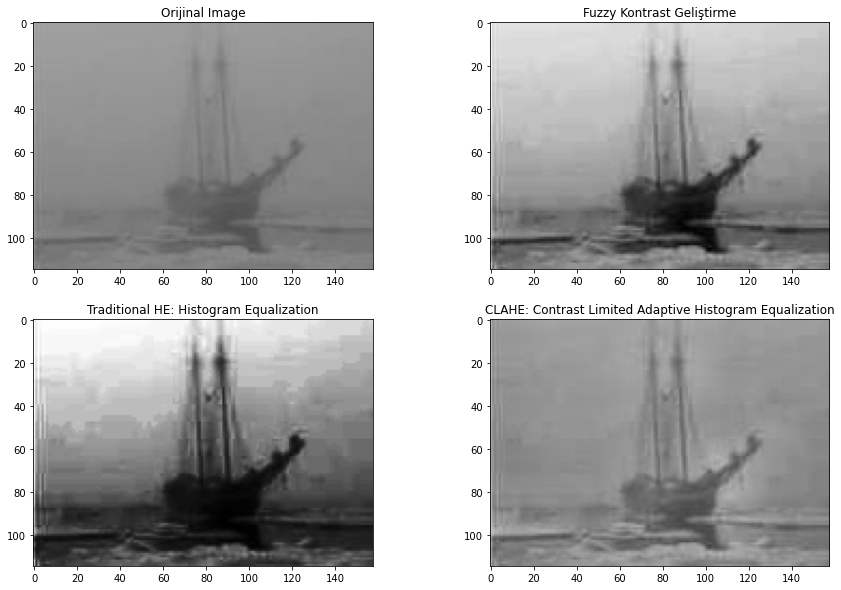

### <p style="text-align: center;">Örnek 2</p>

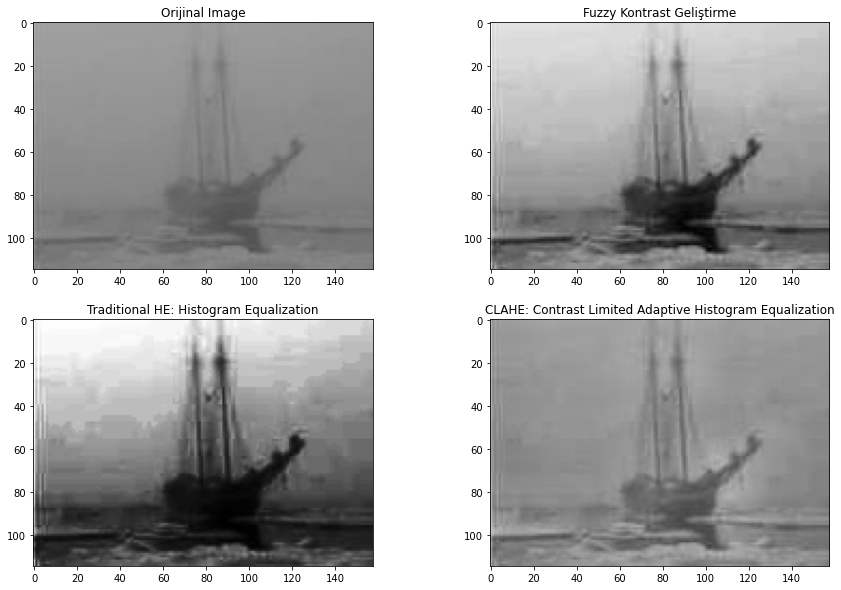

### <p style="text-align: center;">Örnek 3</p>

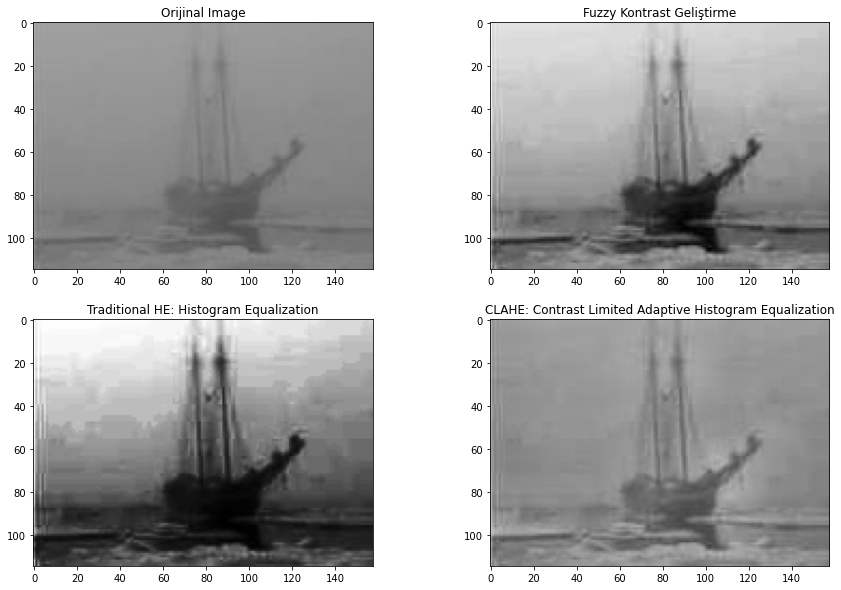

### <p style="text-align: center;">Örnek 4</p>

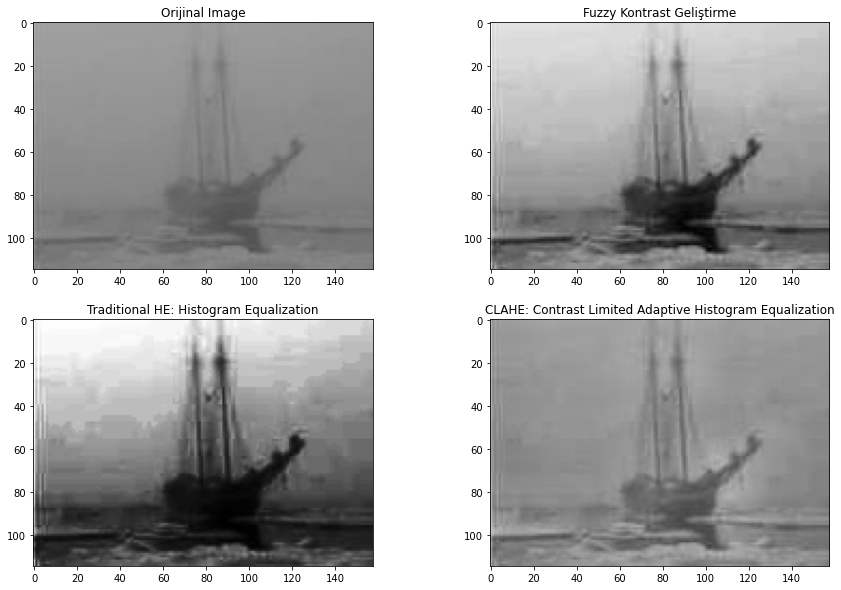

### <p style="text-align: center;">Örnek 5</p>

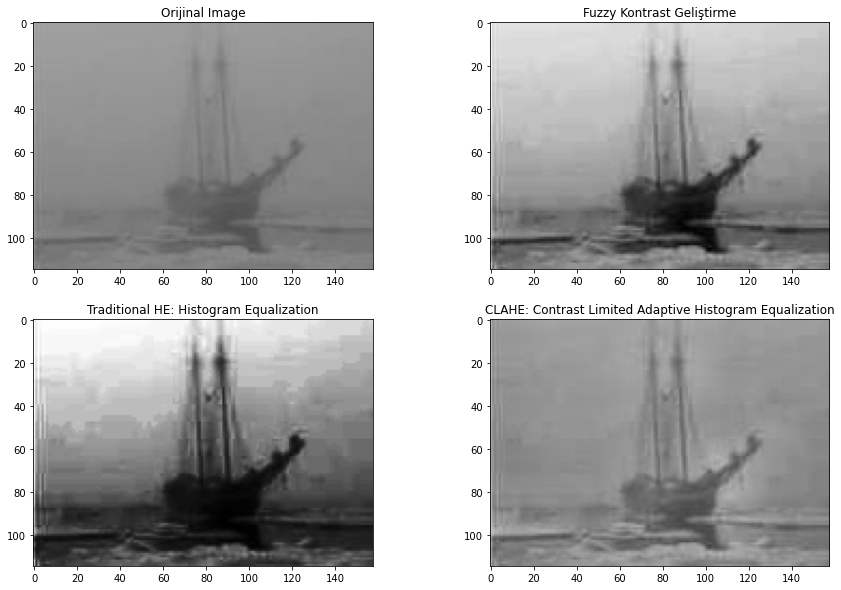

### <p style="text-align: center;">Örnek 6</p>

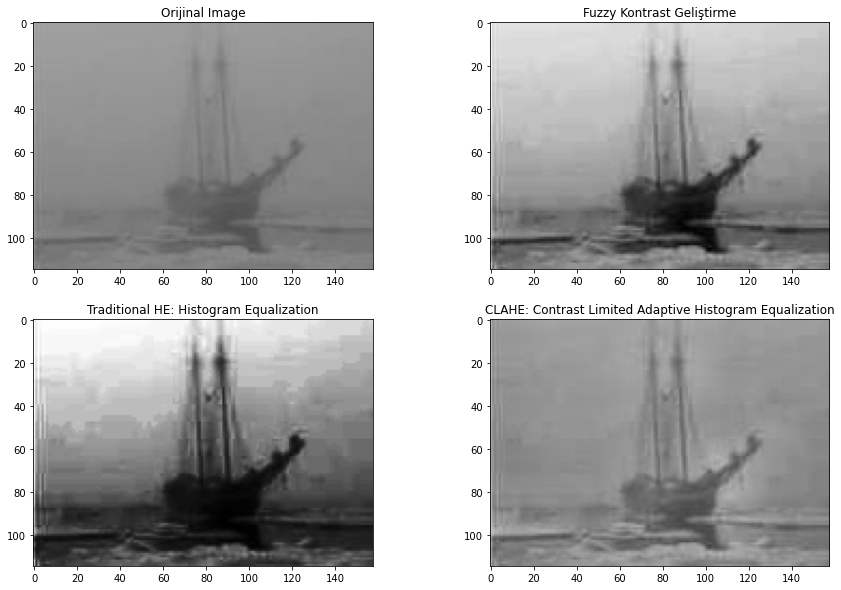

### <p style="text-align: center;">Örnek 7</p>

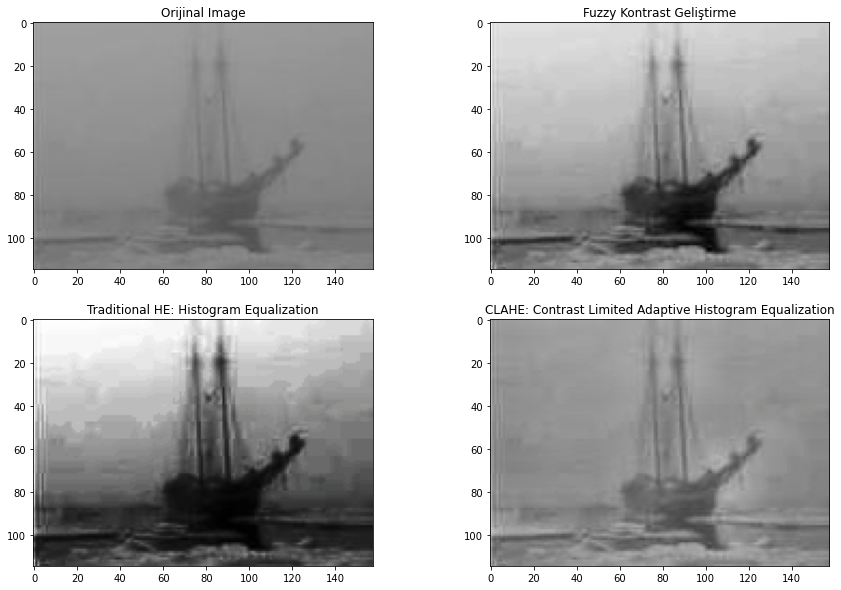

### <p style="text-align: center;">Örnek 8</p>

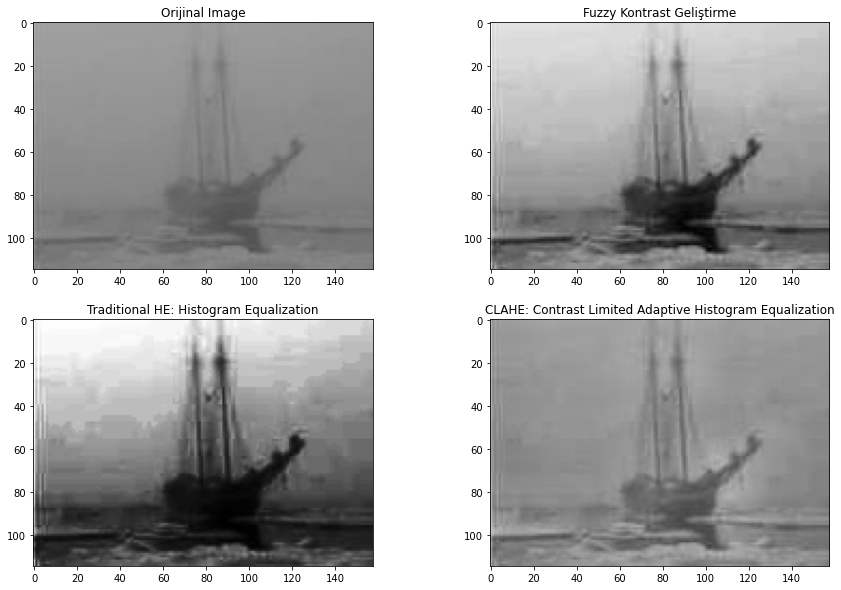

### <p style="text-align: center;">Örnek 9</p>

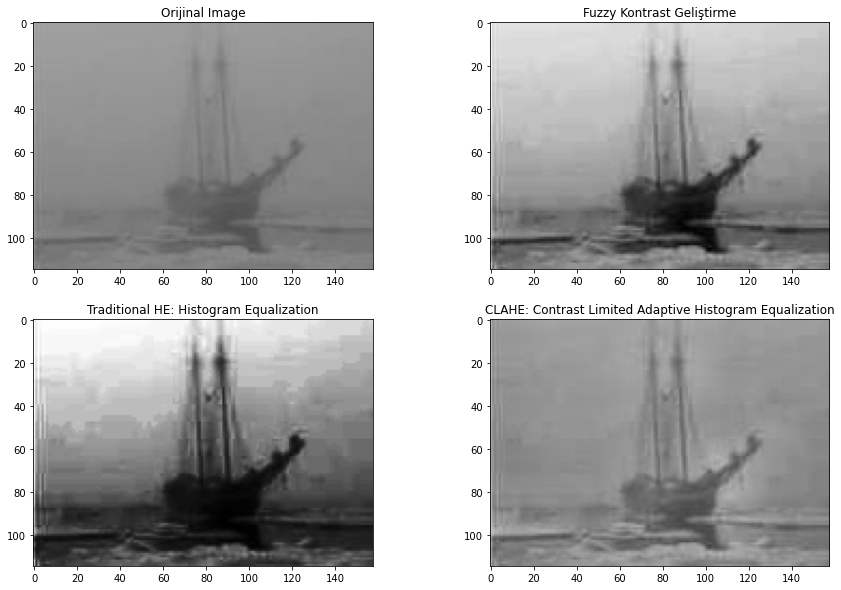

### <p style="text-align: center;">Örnek 10</p>

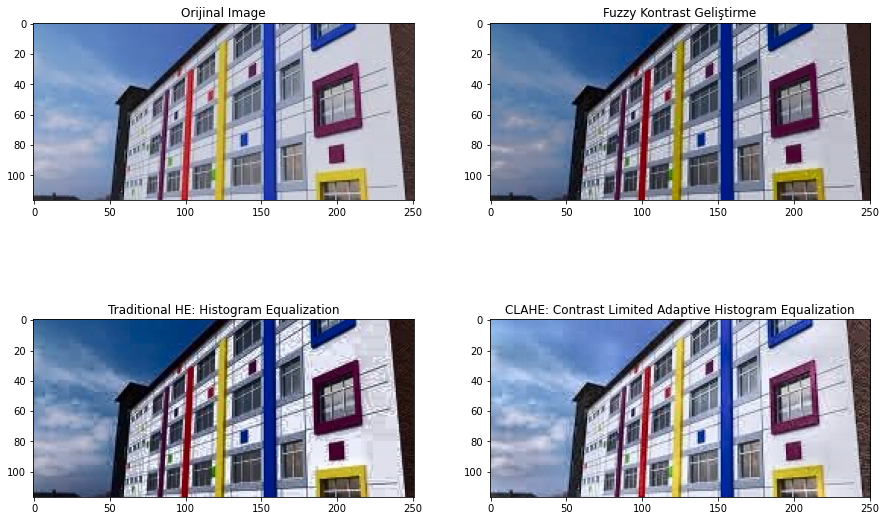

### <p style="text-align: center;">Örnek 11</p>

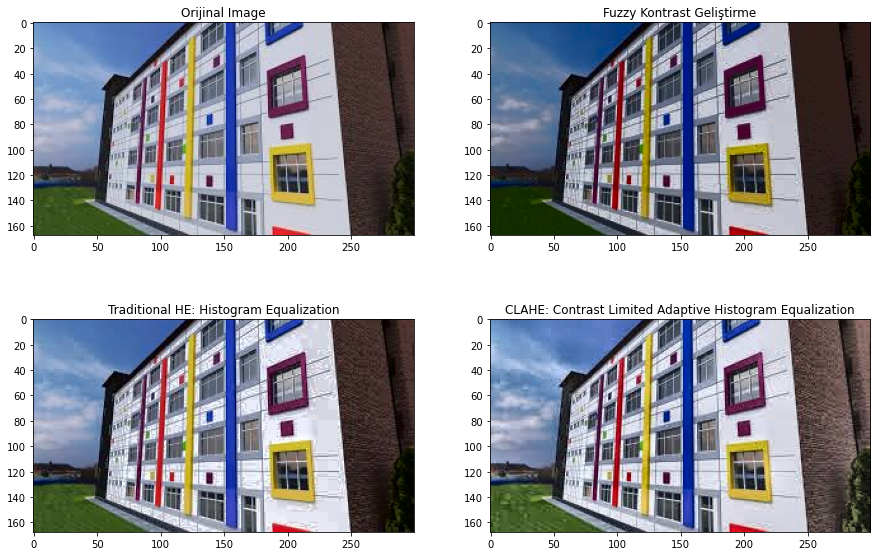

### <p style="text-align: center;">Örnek 12</p>

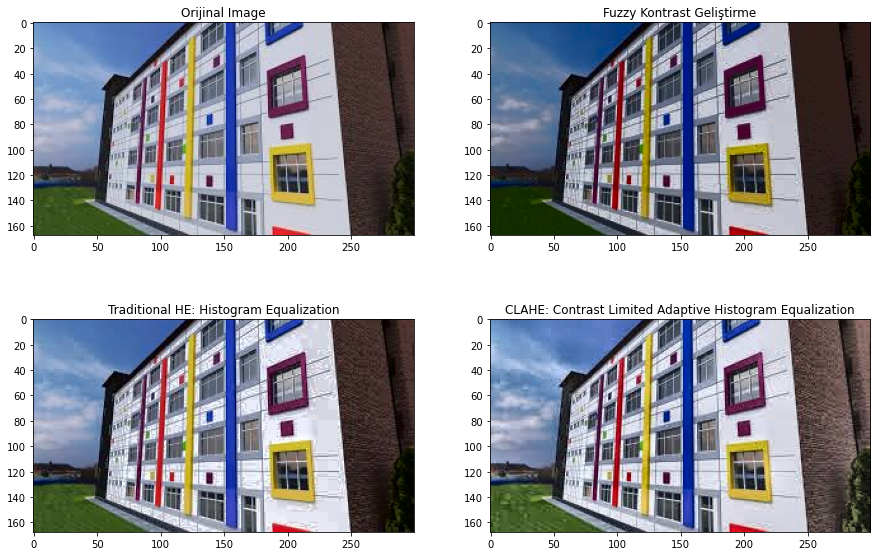

### <p style="text-align: center;">Örnek 13</p>

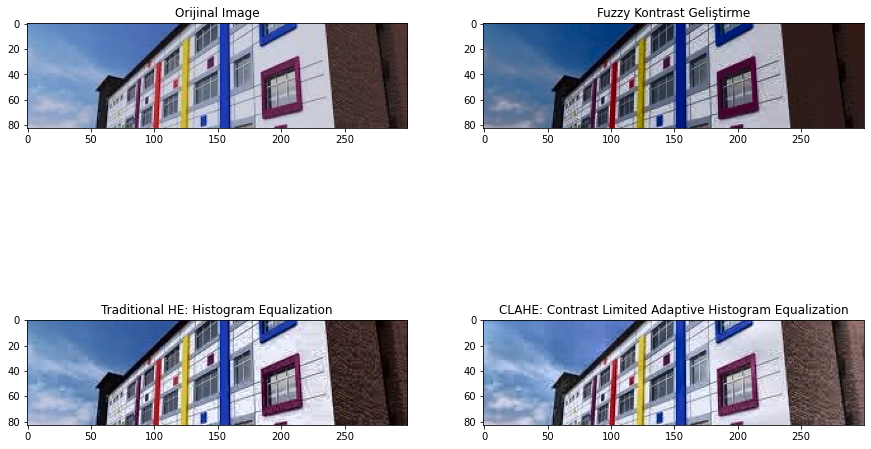

### <p style="text-align: center;">Örnek 14</p>

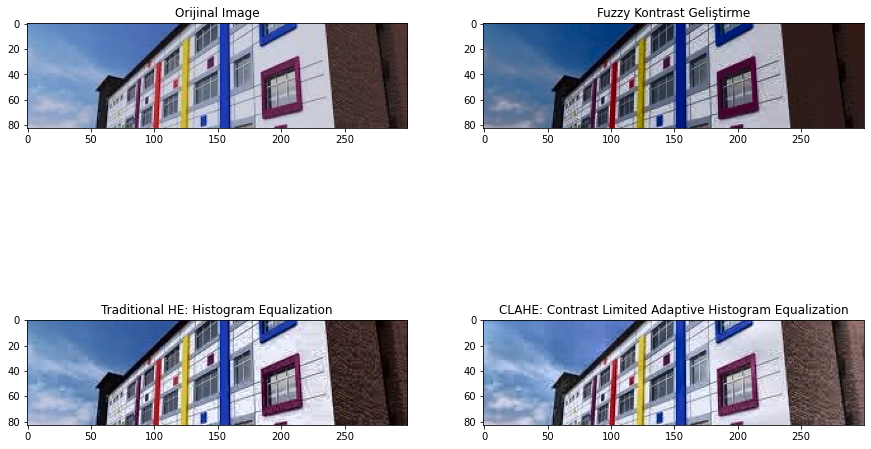

### <p style="text-align: center;">Örnek 15</p>

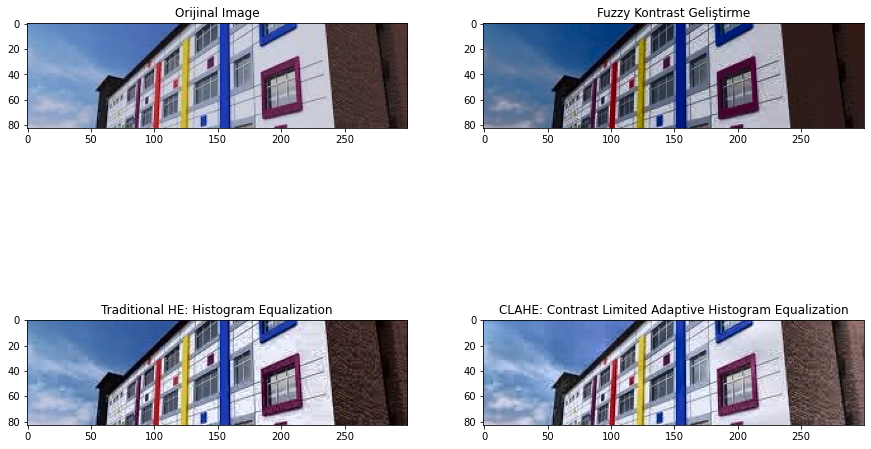

### <p style="text-align: center;">Örnek 16</p>

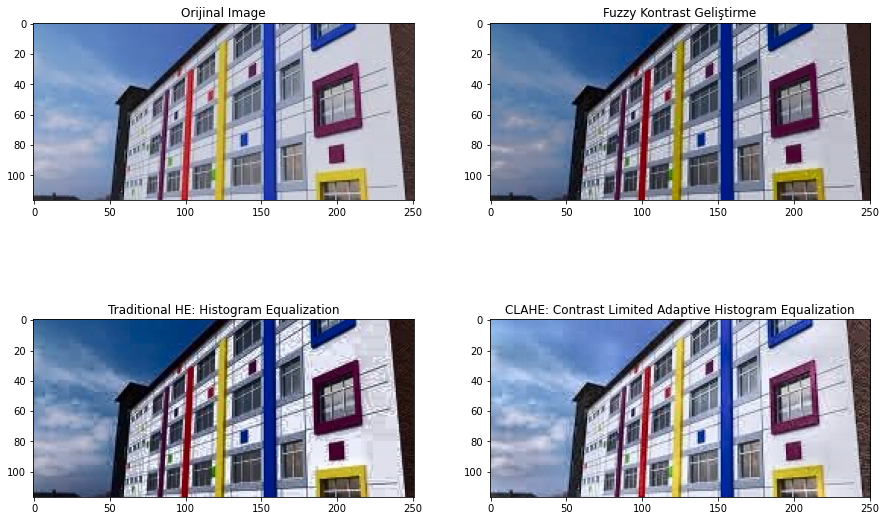

### <p style="text-align: center;">Örnek 17</p>

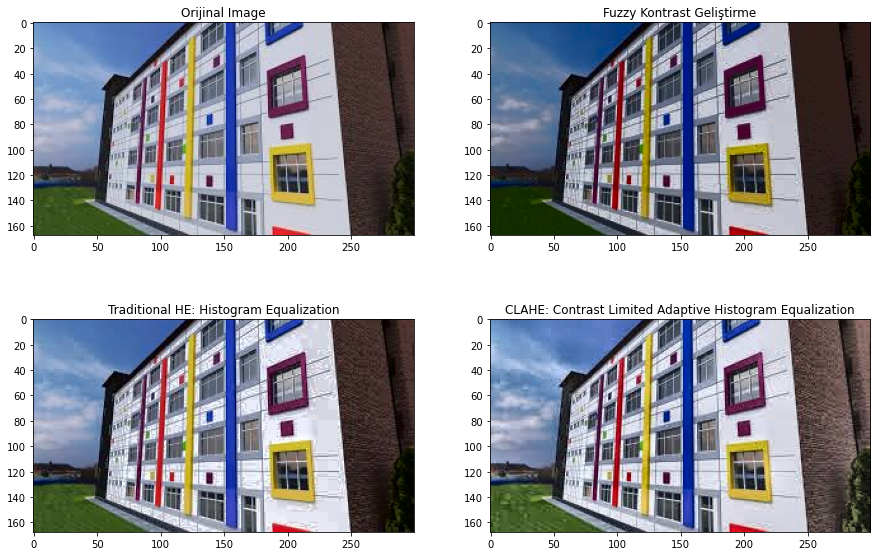

### <p style="text-align: center;">Örnek 18</p>

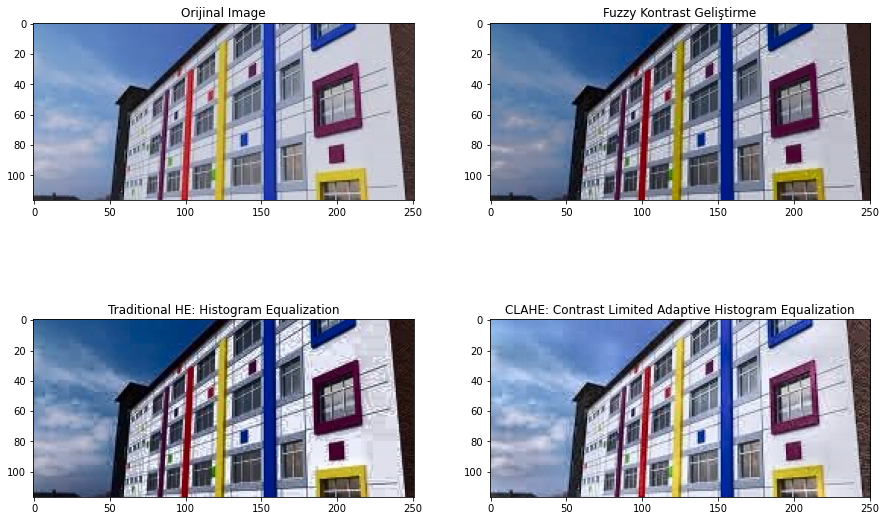

### <p style="text-align: center;">Örnek 19</p>

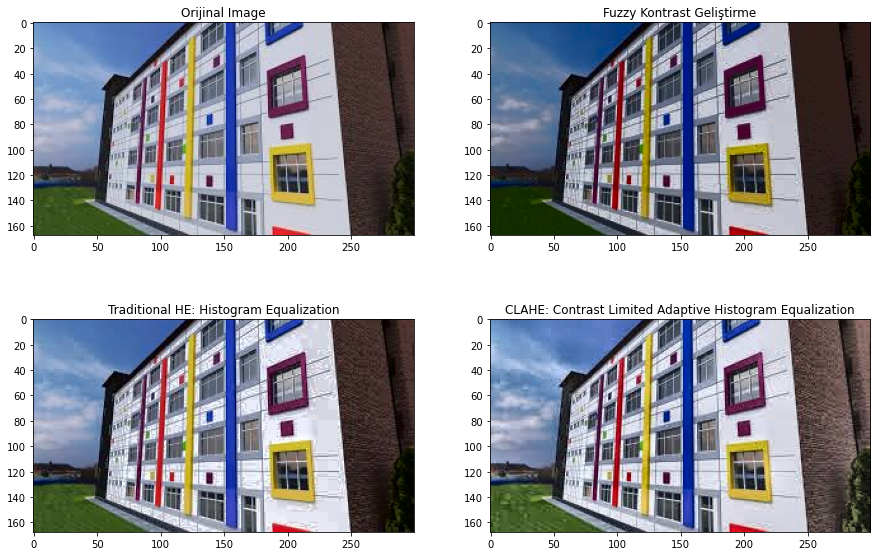

### <p style="text-align: center;">Örnek 20</p>

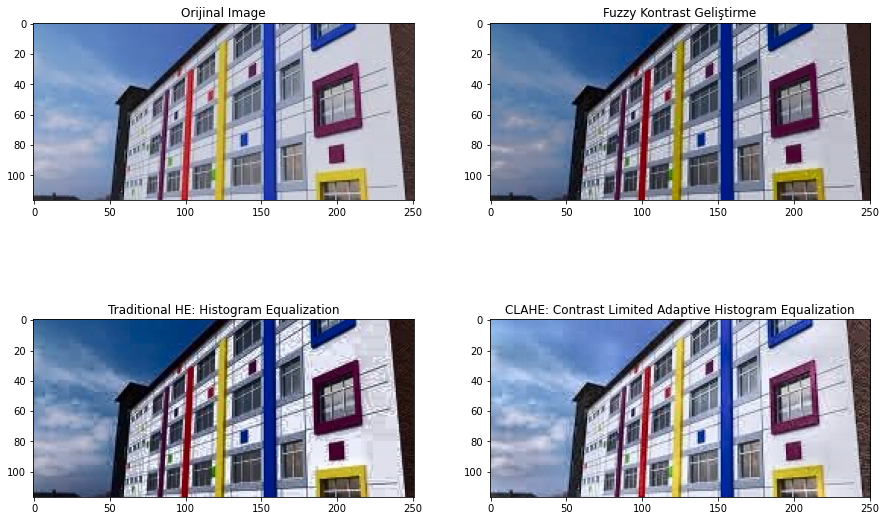

### <p style="text-align: center;">Örnek 21</p>

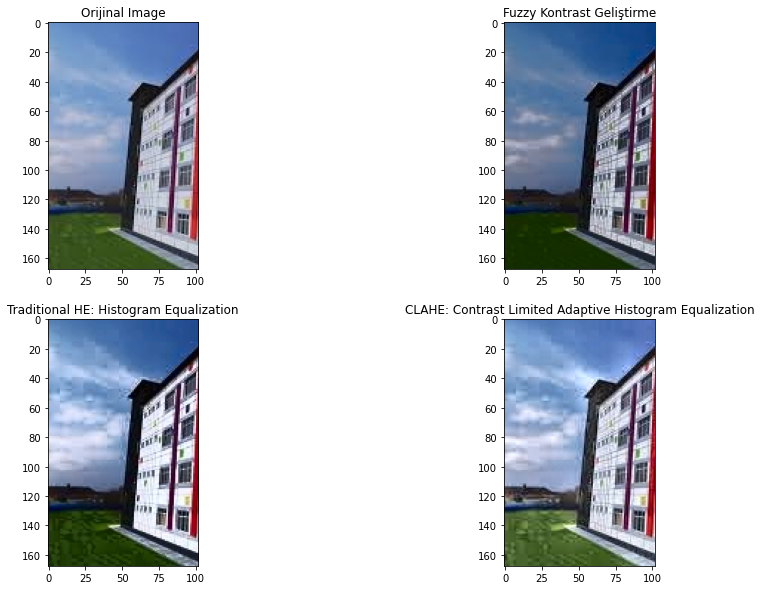

### <p style="text-align: center;">Örnek 22</p>

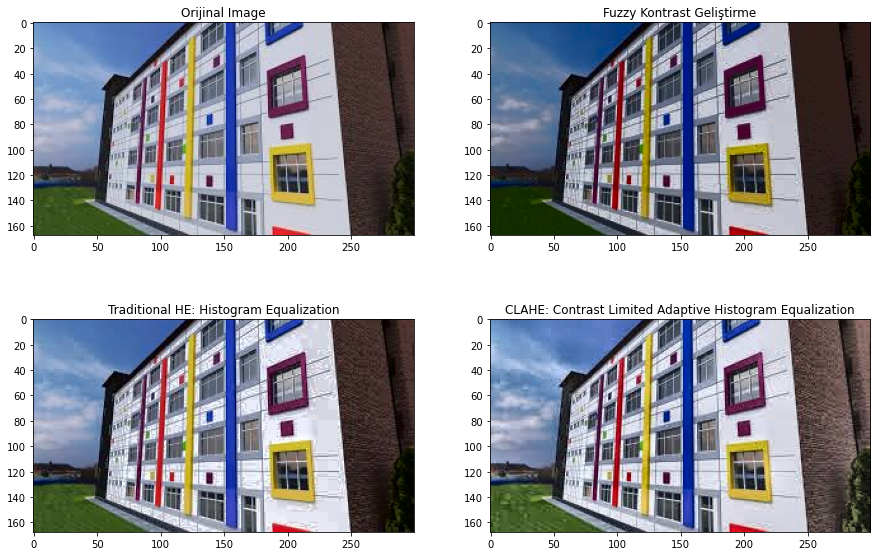

### <p style="text-align: center;">Örnek 23</p>

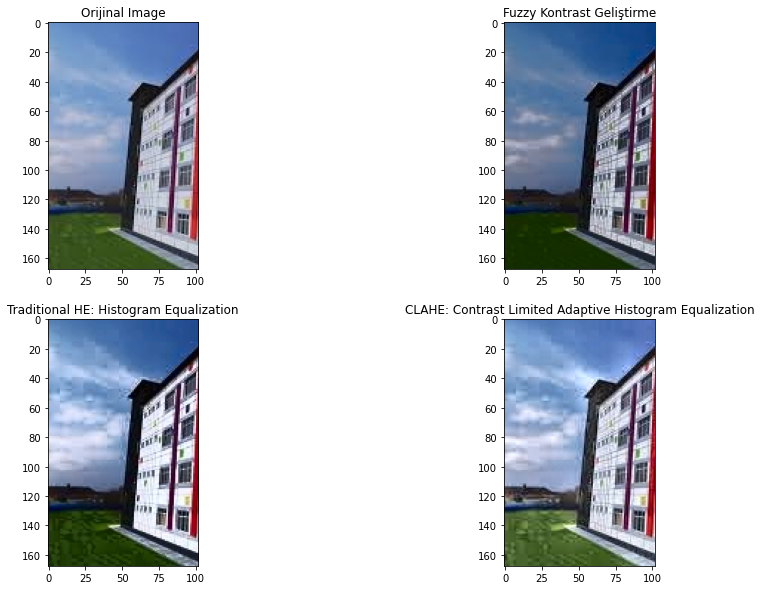

### <p style="text-align: center;">Örnek 24</p>

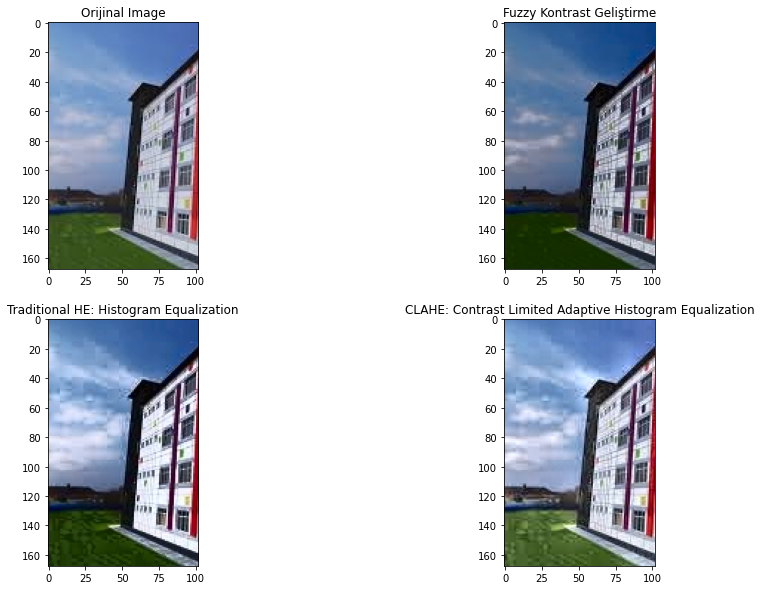

### <p style="text-align: center;">Örnek 25</p>

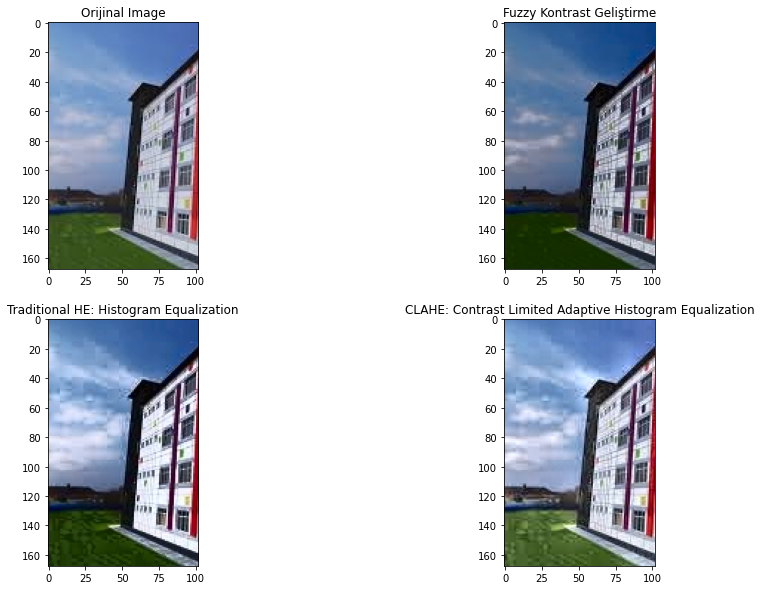

### <p style="text-align: center;">Örnek 26</p>

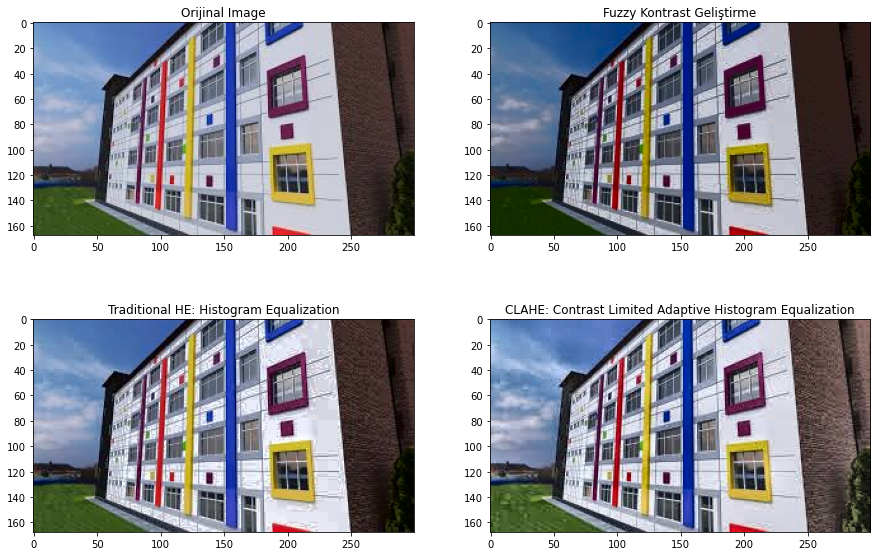

### <p style="text-align: center;">Örnek 27</p>

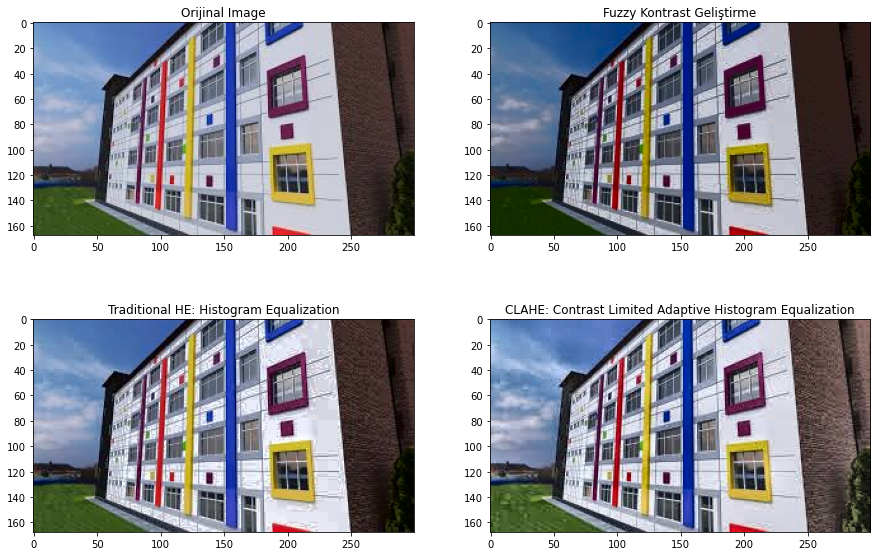

### <p style="text-align: center;">Örnek 28</p>

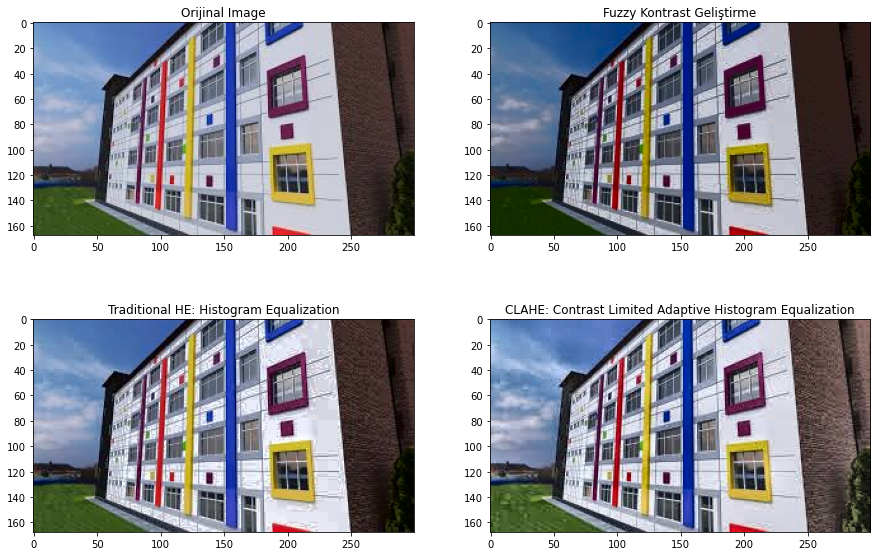

### <p style="text-align: center;">Örnek 29</p>

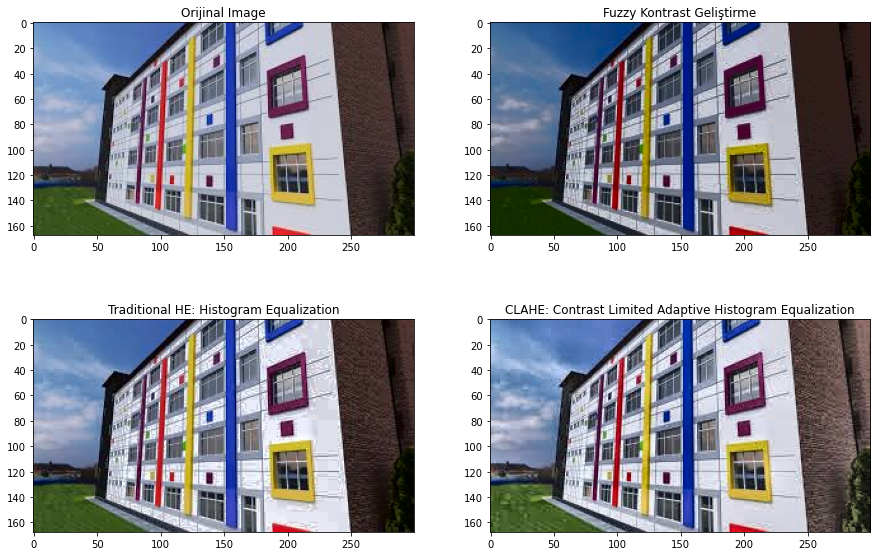

### <p style="text-align: center;">Örnek 30</p>

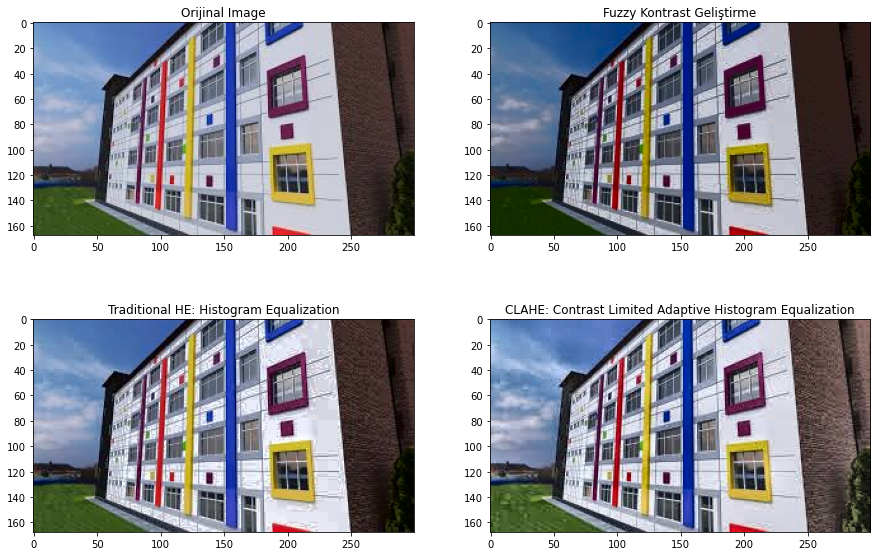

In [ ]:
for i in range(data.shape[0]):
    img = data[i]
    fce = FuzzyContrastEnhance(img)
    he = HE(img)
    clahe = CLAHE(img) 
    display(Markdown(f'### <p style="text-align: center;">Örnek {i+1}</p>'))
    plt.figure(figsize=(15, 10))
    plt.subplot(2, 2, 1)
    plt.imshow(data[i])
    plt.title('Orijinal Görüntü')
    
    plt.subplot(2, 2, 2)
    plt.imshow(fce)
    plt.title('Fuzzy ile Kontrast Geliştirilmiş')
    
    plt.subplot(2, 2, 3)
    plt.imshow(he)
    plt.title('Traditional HE: Histogram Equalization')
    
    plt.subplot(2, 2, 4)
    plt.imshow(clahe)
    plt.title('CLAHE: Contrast Limited Adaptive Histogram Equalization')
    
    plt.show()

In [ ]:
%%time
for i in range(30):
    FuzzyContrastEnhance(data[i])

Wall time: 3.06 s


In [ ]:
%%time
for i in range(30):
    HE(data[i])

Wall time: 47.9 ms


In [ ]:
%%time
for i in range(30):
    CLAHE(data[i])

Wall time: 40.9 ms


In [ ]:
def MSE(img1, img2):
    return np.mean(np.square(img1 - img2))

def PSNR(Max, MSE):
    return 10*math.log10(Max**2/MSE)

In [ ]:
display(Markdown(f'FCE: {PSNR(255*255, np.mean([MSE(org, FuzzyContrastEnhance(org)) for org in data]))}'))
display(Markdown(f'HE: {PSNR(255*255, np.mean([MSE(org, HE(org)) for org in data]))}'))
display(Markdown(f'CLAHE: {PSNR(255*255, np.mean([MSE(org, CLAHE(org)) for org in data]))}'))

FCE: 75.771236980593

HE: 76.50365521397012

CLAHE: 77.37850275404425

Kaynakça:

Image contrast enhancement using fuzzy logic
https://arxiv.org/ftp/arxiv/papers/1809/1809.04529.pdf

A fast and efficient color image enhancement method based on fuzzy-logic and histogram
http://dx.doi.org/10.1016/j.aeue.2013.08.015